In [5]:
import pandas as pd # dataframe manipulation
import numpy as np # linear algebra

# data visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import shap

# sklearn 
from sklearn.cluster import KMeans
from sklearn.preprocessing import PowerTransformer, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score, classification_report

from pyod.models.ecod import ECOD
from yellowbrick.cluster import KElbowVisualizer

import lightgbm as lgb
import prince



In [6]:
df = pd.read_csv("data/train.csv", sep = ";")
df = df.iloc[:, 0:8]

In [7]:
df

,age,job,marital,education,default,balance,housing,loan
0,58,management,married,tertiary,no,2143,yes,no
1,44,technician,single,secondary,no,29,yes,no
2,33,entrepreneur,married,secondary,no,2,yes,yes
3,47,blue-collar,married,unknown,no,1506,yes,no
4,33,unknown,single,unknown,no,1,no,no
...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no
45207,71,retired,divorced,primary,no,1729,no,no
45208,72,retired,married,secondary,no,5715,no,no
45209,57,blue-collar,married,secondary,no,668,no,no




`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



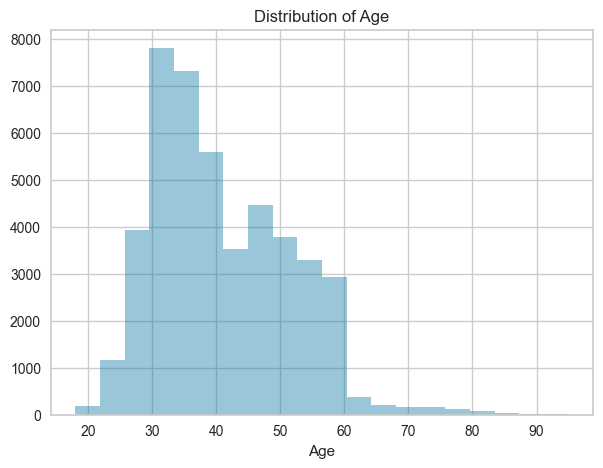

In [8]:
# EDA

# distributions of age
plt.figure(figsize = (7, 5))
sns.distplot(df["age"], bins = 20, kde = False)
plt.title("Distribution of Age")
plt.xlabel("Age")
plt.show()



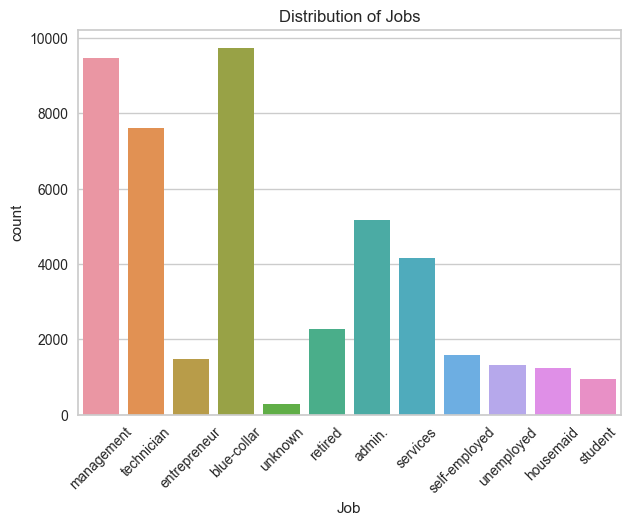

In [9]:
# distribution of job
plt.figure(figsize = (7, 5))
sns.countplot(data=df, x="job")
plt.title("Distribution of Jobs")
plt.xlabel("Job")
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.show()



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



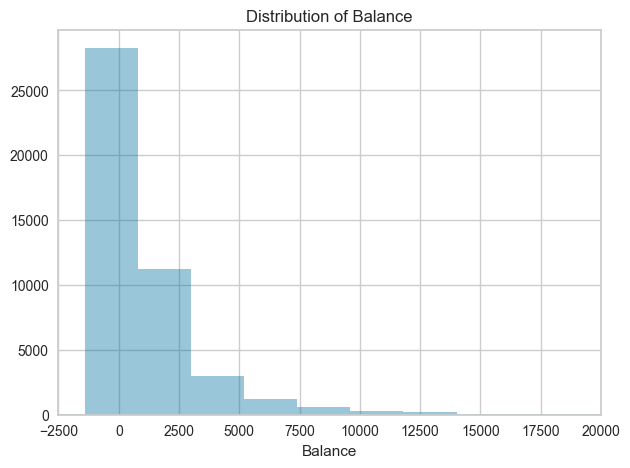

In [10]:
# distribution of balance 
plt.figure(figsize = (7, 5))
sns.distplot(df["balance"], bins = 50, kde = False)

# set x axis limit
plt.xlim(-2500, 20000)

plt.title("Distribution of Balance")
plt.xlabel("Balance")
plt.show()

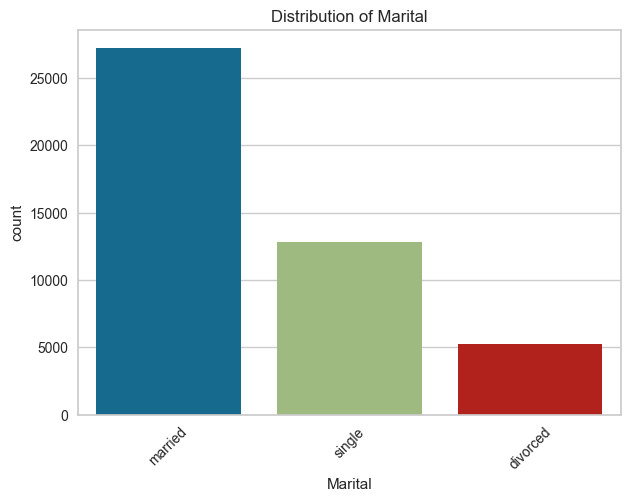

In [11]:
#distribution of marital
plt.figure(figsize = (7, 5))
sns.countplot(data=df, x="marital")
plt.title("Distribution of Marital")
plt.xlabel("Marital")
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.show()


<h1> Preprocessing </h1>

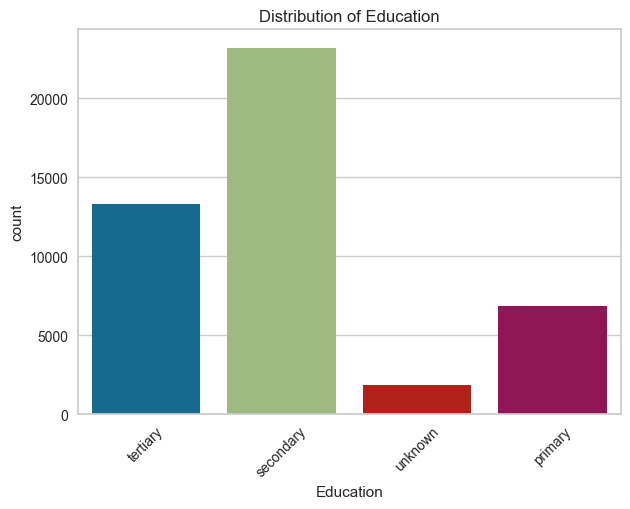

In [12]:
# distribution of education
plt.figure(figsize = (7, 5))
sns.countplot(data=df, x="education")
plt.title("Distribution of Education")
plt.xlabel("Education")
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.show()

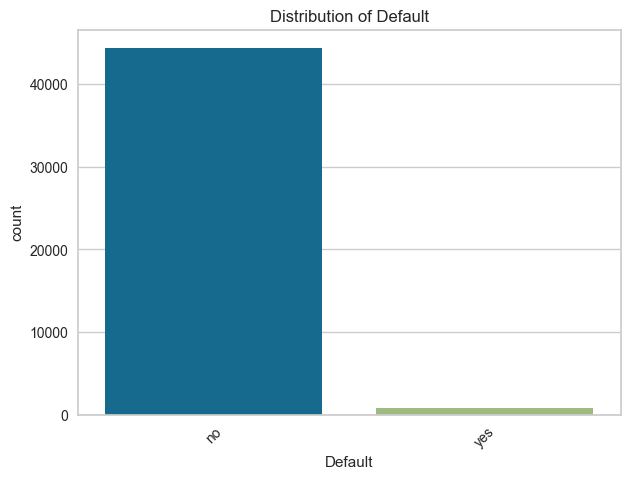

In [13]:
# distribution of default
plt.figure(figsize = (7, 5))
sns.countplot(data=df, x="default")
plt.title("Distribution of Default")
plt.xlabel("Default")
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.show()


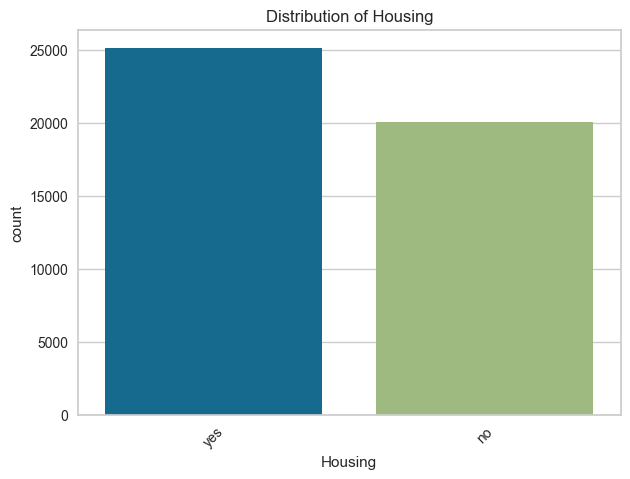

In [14]:
# distribution of housing
plt.figure(figsize = (7, 5))
sns.countplot(data=df, x="housing")
plt.title("Distribution of Housing")
plt.xlabel("Housing")
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.show()

In [15]:
df

,age,job,marital,education,default,balance,housing,loan
0,58,management,married,tertiary,no,2143,yes,no
1,44,technician,single,secondary,no,29,yes,no
2,33,entrepreneur,married,secondary,no,2,yes,yes
3,47,blue-collar,married,unknown,no,1506,yes,no
4,33,unknown,single,unknown,no,1,no,no
...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no
45207,71,retired,divorced,primary,no,1729,no,no
45208,72,retired,married,secondary,no,5715,no,no
45209,57,blue-collar,married,secondary,no,668,no,no


In [16]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler

categorical_transformer_onehot = Pipeline(
    steps=[
        ("encoder", OneHotEncoder(handle_unknown="ignore", drop="first", sparse=False))
    ])

categorical_transformer_ordinal = Pipeline(
    steps=[
        ("encoder", OrdinalEncoder())
    ])

num = Pipeline(
    steps=[
        ("encoder", StandardScaler())
    ])


preprocessor  = ColumnTransformer(transformers = [
                                        ('cat_onehot', categorical_transformer_onehot, ["default", "housing", "loan", "job", "marital"]),
                                        ('cat_ordinal', categorical_transformer_ordinal, ["education"]),
                                        ('num', num, ["age", "balance"])
                                        ])

pipeline = Pipeline(
    steps=[("preprocessor", preprocessor)]
    )
pipe_fit = pipeline.fit(df)

data = pd.DataFrame(pipe_fit.transform(df), columns = pipe_fit.get_feature_names_out().tolist())
# data = pd.DataFrame.sparse.from_spmatrix(pipe_fit.transform(df), columns = pipe_fit.get_feature_names_out().tolist())

# dtype_dict = {col:float  for col in data.columns}
# data = data.astype(dtype_dict)

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


In [17]:
data

,cat_onehot__default_yes,cat_onehot__housing_yes,cat_onehot__loan_yes,cat_onehot__job_blue-collar,cat_onehot__job_entrepreneur,cat_onehot__job_housemaid,cat_onehot__job_management,cat_onehot__job_retired,cat_onehot__job_self-employed,cat_onehot__job_services,cat_onehot__job_student,cat_onehot__job_technician,cat_onehot__job_unemployed,cat_onehot__job_unknown,cat_onehot__marital_married,cat_onehot__marital_single,cat_ordinal__education,num__age,num__balance
0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,1.606965,0.256419
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.288529,-0.437895
2,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,-0.747384,-0.446762
3,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,3.0,0.571051,0.047205
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,3.0,-0.747384,-0.447091
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.947747,-0.176460
45207,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.831227,0.120447
45208,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,2.925401,1.429593
45209,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.512791,-0.228024


In [18]:
data.columns.tolist()

['cat_onehot__default_yes',
 'cat_onehot__housing_yes',
 'cat_onehot__loan_yes',
 'cat_onehot__job_blue-collar',
 'cat_onehot__job_entrepreneur',
 'cat_onehot__job_housemaid',
 'cat_onehot__job_management',
 'cat_onehot__job_retired',
 'cat_onehot__job_self-employed',
 'cat_onehot__job_services',
 'cat_onehot__job_student',
 'cat_onehot__job_technician',
 'cat_onehot__job_unemployed',
 'cat_onehot__job_unknown',
 'cat_onehot__marital_married',
 'cat_onehot__marital_single',
 'cat_ordinal__education',
 'num__age',
 'num__balance']

In [19]:
# from sklearn.pipeline import Pipeline
# from sklearn.compose import ColumnTransformer
# from sklearn.preprocessing import OneHotEncoder

# # categorical_transformer_onehot = Pipeline(
# #     steps=[
# #         ("encoder", OneHotEncoder(handle_unknown="ignore"))
# #     ])

# categorical_transformer_ordinal = Pipeline(
#     steps=[
#         ("encoder", OrdinalEncoder())
#     ])

# numerical_transfomer = Pipeline(
#     steps=[
#         ("encoder", PowerTransformer())
#     ])


# preprocessor  = ColumnTransformer(transformers = [
#                                         ('cat_ordinal', categorical_transformer_ordinal, ["education","default", "housing", "loan", "job", "marital"])])
                                       

# pipeline = Pipeline(
#     steps=[("preprocessor", preprocessor)]
#     )
# pipe_fit = pipeline.fit(df)

# pipe_fit.transform(df)

# data = pd.DataFrame(pipe_fit.transform(df), columns = pipe_fit.get_feature_names_out().tolist())

In [20]:
# preprocessor  = ColumnTransformer(transformers = [    
#                                         ('num', numerical_transfomer, data.columns.tolist())
#                                         ])

# pipeline = Pipeline(
#     steps=[("preprocessor", preprocessor)]
#     )
# pipe_fit = pipeline.fit(data)


# data = pd.DataFrame(pipe_fit.transform(data), columns = pipe_fit.get_feature_names_out().tolist())
# data

<h1> Outliers </h1>

In [21]:
# https://github.com/yzhao062/pyod
clf = ECOD()
clf.fit(data)
outliers = clf.predict(data) 

data["outliers"] = outliers
df["outliers"] = outliers

# Data without outliers
data_no_outliers = data[data["outliers"] == 0]
data_no_outliers = data_no_outliers.drop(["outliers"], axis = 1)

# Data with Outliers
data_with_outliers = data.copy()
data_with_outliers = data_with_outliers.drop(["outliers"], axis = 1)

# Original Data with Outliers
df_no_outliers = df[df["outliers"] == 0]
df_no_outliers = df_no_outliers.drop(["outliers"], axis = 1)


In [22]:
print(data_no_outliers.shape)
print(data_with_outliers.shape)
print(df_no_outliers.shape)

(40690, 19)
(45211, 19)
(40690, 8)


In [23]:
data_no_outliers

,cat_onehot__default_yes,cat_onehot__housing_yes,cat_onehot__loan_yes,cat_onehot__job_blue-collar,cat_onehot__job_entrepreneur,cat_onehot__job_housemaid,cat_onehot__job_management,cat_onehot__job_retired,cat_onehot__job_self-employed,cat_onehot__job_services,cat_onehot__job_student,cat_onehot__job_technician,cat_onehot__job_unemployed,cat_onehot__job_unknown,cat_onehot__marital_married,cat_onehot__marital_single,cat_ordinal__education,num__age,num__balance
0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,1.606965,0.256419
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.288529,-0.437895
2,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,-0.747384,-0.446762
3,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,3.0,0.571051,0.047205
5,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,-0.559037,-0.371551
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45202,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,-0.653211,-0.264480
45205,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,-1.500776,-0.281559
45206,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.947747,-0.176460
45209,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.512791,-0.228024


<h1> Modeling </h1>

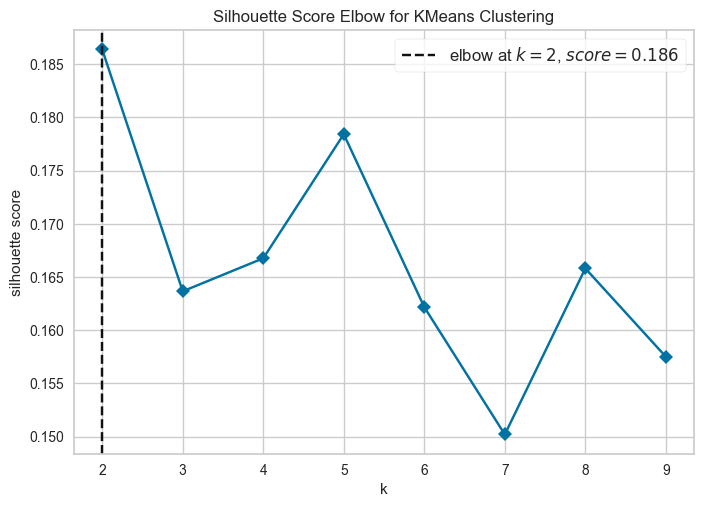

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [24]:
# Instantiate the clustering model and visualizer
km = KMeans(init="k-means++", random_state=0, n_init="auto")
visualizer = KElbowVisualizer(km, k=(2,10), locate_elbow=True, metric="silhouette", timings=False)
 
visualizer.fit(data_no_outliers)        # Fit the data to the visualizer
visualizer.show()       

In [25]:
# def make_Silhouette_plot(X, n_clusters):
#     plt.xlim([-0.1, 1])
#     plt.ylim([0, len(X) + (n_clusters + 1) * 10])
#     clusterer = KMeans(n_clusters=n_clusters, max_iter = 1000, n_init = 10, init = 'k-means++', random_state=10)
#     cluster_labels = clusterer.fit_predict(X)
#     silhouette_avg = silhouette_score(X, cluster_labels)
#     print(
#         "For n_clusters =", n_clusters,
#         "The average silhouette_score is :", silhouette_avg,
#     )
# # Compute the silhouette scores for each sample
#     sample_silhouette_values = silhouette_samples(X, cluster_labels)
#     y_lower = 10
#     for i in range(n_clusters):
#         ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
#         ith_cluster_silhouette_values.sort()
#         size_cluster_i = ith_cluster_silhouette_values.shape[0]
#         y_upper = y_lower + size_cluster_i
#         color = cm.nipy_spectral(float(i) / n_clusters)
#         plt.fill_betweenx(
#             np.arange(y_lower, y_upper),
#             0,
#             ith_cluster_silhouette_values,
#             facecolor=color,
#             edgecolor=color,
#             alpha=0.7,
#         )
#         plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
#         y_lower = y_upper + 10
#         plt.title(f"The Silhouette Plot for n_cluster = {n_clusters}", fontsize=26)
#         plt.xlabel("The silhouette coefficient values", fontsize=24)
#         plt.ylabel("Cluster label", fontsize=24)
#         plt.axvline(x=silhouette_avg, color="red", linestyle="--")
#         plt.yticks([])  
#         plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
# range_n_clusters = list(range(2,10))
# for n_clusters in range_n_clusters:
#     print(f"N cluster: {n_clusters}")
#     make_Silhouette_plot(data_no_outliers, n_clusters)   
#     plt.savefig('Silhouette_plot_{}.png'.format(n_clusters))
#     plt.close()

<h2> The best number is 5-6 </h2>

In [26]:
km = KMeans(n_clusters=4, init='k-means++', n_init=10, max_iter=100, random_state=42)
clusters_predict = km.fit_predict(data_no_outliers)
print(km.inertia_)

86956.82147205994


In [27]:
np.unique(clusters_predict)

array([0, 1, 2, 3])

In [28]:
# from sklearn.metrics import silhouette_score
# from sklearn.metrics import calinski_harabasz_score
# from sklearn.metrics import davies_bouldin_score

# """
# The Davies Bouldin index is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances.
# The minimum value of the DB Index is 0, whereas a smaller value (closer to 0) represents a better model that produces better clusters.
# """
# print(f"Davies bouldin score: {davies_bouldin_score(data_no_outliers,clusters_predict)}")

# """
# Calinski Harabaz Index -> Variance Ratio Criterion.
# Calinski Harabaz Index is defined as the ratio of the sum of between-cluster dispersion and of within-cluster dispersion.
# The higher the index the more separable the clusters.
# """
# print(f"Calinski Score: {calinski_harabasz_score(data_no_outliers,clusters_predict)}")


# """
# The silhouette score is a metric used to calculate the goodness of fit of a clustering algorithm, but can also be used as a method for determining an optimal value of k (see here for more).
# Its value ranges from -1 to 1.
# A value of 0 indicates clusters are overlapping and either the data or the value of k is incorrect.
# 1 is the ideal value and indicates that clusters are very dense and nicely separated.
# """
# print(f"Silhouette Score: {silhouette_score(data_no_outliers,clusters_predict)}")

<h2> Visualitation </h2>

In [29]:
def get_pca_2d(df, predict):

    pca_2d_object = prince.PCA(
    n_components=2,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_2d_object.fit(df)

    df_pca_2d = pca_2d_object.transform(df)
    df_pca_2d.columns = ["component-1", "component-2"]
    df_pca_2d["cluster"] = predict

    return pca_2d_object, df_pca_2d



def get_pca_3d(df, predict):

    pca_3d_object = prince.PCA(
    n_components=3,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_3d_object.fit(df)

    df_pca_3d = pca_3d_object.transform(df)
    df_pca_3d.columns = ["component-1", "component-2", "component-3"]
    df_pca_3d["cluster"] = predict

    return pca_3d_object, df_pca_3d



def plot_pca_3d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    columns = df.columns[0:3].tolist()

    fig = px.scatter_3d(df, 
                        x=columns[0], 
                        y=columns[1], 
                        z=columns[2],
                        color='cluster',
                        template="plotly",
                        
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 4,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 1000, 
                                height = 800, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'component-1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'component-2', titlefont_color = 'black'),
                                            zaxis=dict(title = 'component-3', titlefont_color = 'black')),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                      
    
    fig.show()


def plot_pca_2d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    columns = df.columns[0:3].tolist()


    fig = px.scatter(df, 
                        x=columns[0], 
                        y=columns[1],
                        color='cluster',
                        template="plotly",
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 8,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 800, 
                                height = 700, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'component-1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'component-2', titlefont_color = 'black'),
                                            ),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                        
        
    fig.show()


In [30]:
# data_no_outliers_to_plot = data_no_outliers.copy()
# data_no_outliers_to_plot["cluster"] = clusters_predict

# plot_pca_3d(data_no_outliers_to_plot, title = "PCA Space", opacity=1, width_line = 0.1)

PCA 3D

In [31]:
data_no_outliers.describe()


,cat_onehot__default_yes,cat_onehot__housing_yes,cat_onehot__loan_yes,cat_onehot__job_blue-collar,cat_onehot__job_entrepreneur,cat_onehot__job_housemaid,cat_onehot__job_management,cat_onehot__job_retired,cat_onehot__job_self-employed,cat_onehot__job_services,cat_onehot__job_student,cat_onehot__job_technician,cat_onehot__job_unemployed,cat_onehot__job_unknown,cat_onehot__marital_married,cat_onehot__marital_single,cat_ordinal__education,num__age,num__balance
count,40690.000000,40690.000000,40690.000000,40690.000000,40690.000000,40690.000000,40690.00000,40690.000000,40690.000000,40690.000000,40690.000000,40690.000000,40690.000000,40690.000000,40690.000000,40690.000000,40690.000000,40690.000000,40690.000000
mean,0.003539,0.579676,0.147088,0.228484,0.029712,0.022880,0.22202,0.032096,0.032170,0.094225,0.006636,0.178299,0.026296,0.001769,0.618506,0.266060,1.213885,-0.034692,-0.061395
std,0.059384,0.493617,0.354198,0.419861,0.169795,0.149524,0.41561,0.176258,0.176454,0.292145,0.081189,0.382769,0.160017,0.042028,0.485759,0.441902,0.708653,0.885588,0.684560
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.971646,-0.993937
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-0.747384,-0.418189
50%,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,-0.182341,-0.298966
75%,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,2.000000,0.665225,-0.004359
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000,3.396271,18.780545


    |
    |
    |
    |
    |
    \/

In [32]:
# minmax scaler for cat_ordinal_education
scaler = StandardScaler()
data_no_outliers["cat_ordinal__education"] = scaler.fit_transform(data_no_outliers["cat_ordinal__education"].values.reshape(-1,1))

In [33]:
# use skle

In [34]:
pca_3d_object, df_pca_3d = get_pca_3d(data_no_outliers, clusters_predict)
plot_pca_3d(df_pca_3d, title = "PCA Space", opacity=1, width_line = 0.1)
print("The variability is :", pca_3d_object.eigenvalues_summary)

The variability is :           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              2.236        11.77%                     11.77%
1              1.771         9.32%                     21.09%
2              1.310         6.90%                     27.98%


PCA 2D

In [35]:
data_no_outliers

,cat_onehot__default_yes,cat_onehot__housing_yes,cat_onehot__loan_yes,cat_onehot__job_blue-collar,cat_onehot__job_entrepreneur,cat_onehot__job_housemaid,cat_onehot__job_management,cat_onehot__job_retired,cat_onehot__job_self-employed,cat_onehot__job_services,cat_onehot__job_student,cat_onehot__job_technician,cat_onehot__job_unemployed,cat_onehot__job_unknown,cat_onehot__marital_married,cat_onehot__marital_single,cat_ordinal__education,num__age,num__balance
0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.109322,1.606965,0.256419
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,-0.301824,0.288529,-0.437895
2,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.301824,-0.747384,-0.446762
3,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.520468,0.571051,0.047205
5,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.109322,-0.559037,-0.371551
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45202,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.301824,-0.653211,-0.264480
45205,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,-0.301824,-1.500776,-0.281559
45206,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.109322,0.947747,-0.176460
45209,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.301824,1.512791,-0.228024


In [36]:
pca_2d_object, df_pca_2d = get_pca_2d(data_no_outliers, clusters_predict)
plot_pca_2d(df_pca_2d, title = "PCA Space", opacity=1, width_line = 0.5)

<h1> T-SNE <h1>

TSNE 3D

In [37]:
sampling_data = data_no_outliers.sample(frac=0.5, replace=True, random_state=1)
sampling_clusters = pd.DataFrame(clusters_predict).sample(frac=0.5, replace=True, random_state=1)[0].values

df_tsne_3d = TSNE(
                  n_components=3, 
                  learning_rate=700, 
                  init='random', 
                  perplexity=100, 
                  n_iter = 1000).fit_transform(sampling_data)

df_tsne_3d = pd.DataFrame(df_tsne_3d, columns=["comp1", "comp2",'comp3'])
df_tsne_3d["cluster"] = sampling_clusters
plot_pca_3d(df_tsne_3d, title = "PCA Space", opacity=1, width_line = 0.1)

In [38]:
plot_pca_3d(df_tsne_3d, title = "PCA Space", opacity=0.3, width_line = 0.1)

TSNE 2D

In [39]:
df_tsne_2d = TSNE(
                  n_components=2, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data)

df_tsne_2d = pd.DataFrame(df_tsne_2d, columns=["comp1", "comp2"])
df_tsne_2d["cluster"] = sampling_clusters

plot_pca_2d(df_tsne_2d, title = "PCA Space", opacity=1, width_line = 0.5)


<h1> Explanations </h1>

In [35]:
data_no_outliers

,cat_onehot__default_yes,cat_onehot__housing_yes,cat_onehot__loan_yes,cat_onehot__job_blue-collar,cat_onehot__job_entrepreneur,cat_onehot__job_housemaid,cat_onehot__job_management,cat_onehot__job_retired,cat_onehot__job_self-employed,cat_onehot__job_services,cat_onehot__job_student,cat_onehot__job_technician,cat_onehot__job_unemployed,cat_onehot__job_unknown,cat_onehot__marital_married,cat_onehot__marital_single,cat_ordinal__education,num__age,num__balance
0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.109322,1.606965,0.256419
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,-0.301824,0.288529,-0.437895
2,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.301824,-0.747384,-0.446762
3,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.520468,0.571051,0.047205
5,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.109322,-0.559037,-0.371551
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45202,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.301824,-0.653211,-0.264480
45205,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,-0.301824,-1.500776,-0.281559
45206,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.109322,0.947747,-0.176460
45209,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,-0.301824,1.512791,-0.228024


[LightGBM] [Warning] Unknown parameter: colsample_by_tree


[LightGBM] [Warning] Unknown parameter: colsample_by_tree
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001801 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 342
[LightGBM] [Info] Number of data points in the train set: 40690, number of used features: 8
[LightGBM] [Info] Start training from score -1.424008
[LightGBM] [Info] Start training from score -1.540363
[LightGBM] [Info] Start training from score -1.397515
[LightGBM] [Info] Start training from score -1.211538


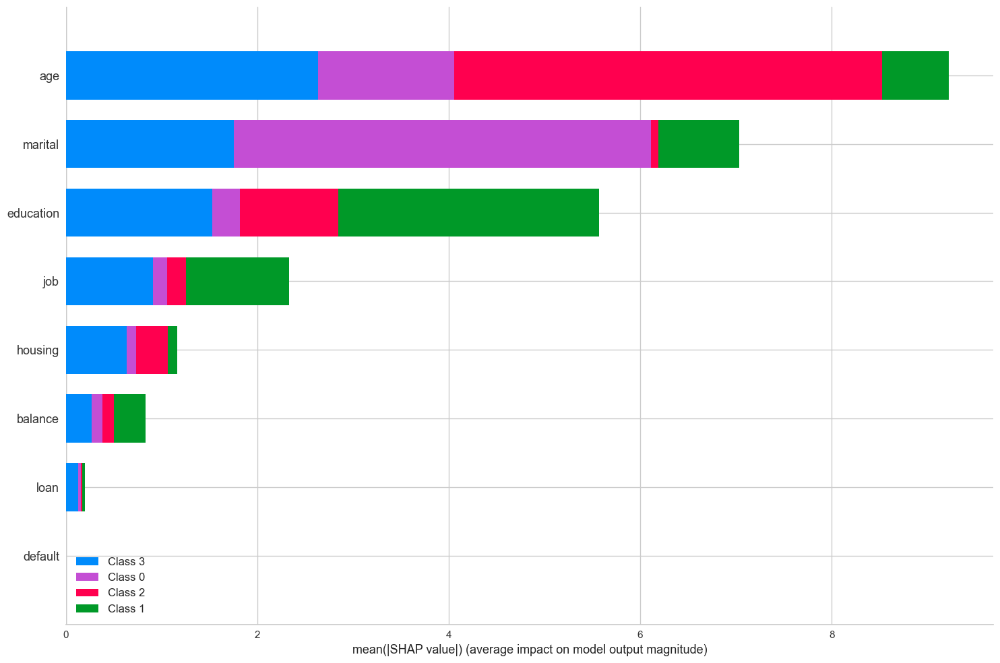

In [36]:
import lightgbm as lgb
import shap


clf_km = lgb.LGBMClassifier(colsample_by_tree=0.8)



for col in ["job", "marital", "education", "housing", "loan", "default"]:
    df_no_outliers[col] = df_no_outliers[col].astype('category')


clf_km.fit(X = df_no_outliers , y = clusters_predict, feature_name = "auto", categorical_feature = "auto")
# clf_km.fit(X = df_prueba, y = predict_embedding, feature_name='auto', categorical_feature = 'auto')
#SHAP values
explainer_km = shap.TreeExplainer(clf_km)
shap_values_km = explainer_km.shap_values(df_no_outliers)
shap.summary_plot(shap_values_km, df_no_outliers, plot_type="bar", plot_size=(15, 10))

In [37]:
y_pred = clf_km.predict(df_no_outliers)
accuracy=accuracy_score(y_pred, clusters_predict)
print('Training-set accuracy score: {0:0.4f}'. format(accuracy))
print(classification_report(clusters_predict, y_pred))

[LightGBM] [Warning] Unknown parameter: colsample_by_tree
Training-set accuracy score: 0.9999
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      9796
           1       1.00      1.00      1.00      8720
           2       1.00      1.00      1.00     10059
           3       1.00      1.00      1.00     12115

    accuracy                           1.00     40690
   macro avg       1.00      1.00      1.00     40690
weighted avg       1.00      1.00      1.00     40690



Clusters Info

In [38]:
df_no_outliers = df[df.outliers == 0]
df_no_outliers["cluster"] = clusters_predict

df_no_outliers.groupby('cluster').agg(
    {
        'job': lambda x: x.value_counts().index[0],
        'marital': lambda x: x.value_counts().index[0],
        'education': lambda x: x.value_counts().index[0],
        'housing': lambda x: x.value_counts().index[0],
        'loan': lambda x: x.value_counts().index[0],
        # 'contact': lambda x: x.value_counts().index[0],
        'age':'mean',
        'balance': 'mean',
        'default': lambda x: x.value_counts().index[0],
        
    }
).sort_values("age").reset_index()

C:\Users\Shamika Tissera\AppData\Local\Temp\ipykernel_27052\1509487301.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,cluster,job,marital,education,housing,loan,age,balance,default
0,0,technician,single,secondary,yes,no,32.570539,1000.440282,no
1,3,blue-collar,married,secondary,yes,no,36.251094,832.623112,no
2,1,management,married,tertiary,no,no,42.041170,1766.771216,no
3,2,blue-collar,married,secondary,no,no,52.277861,1245.727607,no
